# Assignment 4: Street Networks & Web Scraping

**Part 1: Visualizing crash data in Philadelphia**

In this section, you will use `osmnx` to analyze the crash incidence in Center City. 


**Part 2: Scraping Craigslist**

In this section, you will use Selenium and BeautifulSoup to scrape data for hundreds of apartments from Philadelphia's Craigslist portal.


**Set up**

In [215]:
!pip install osmnx

In [216]:

import altair as alt
import geopandas as gpd
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import osmnx as ox

In [217]:
# Show all columns in dataframes
pd.options.display.max_columns = 999

np.seterr(invalid="ignore")

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'ignore'}

## Part 1: Visualizing crash data in Philadelphia

### 1.1 Load the geometry for the region being analyzed

We'll analyze crashes in the "Central" planning district in Philadelphia, a rough approximation for Center City. [Planning districts](https://www.opendataphilly.org/dataset/planning-districts) can be loaded from Open Data Philly. Read the data into a GeoDataFrame using the following link:

[http://data.phl.opendata.arcgis.com/datasets/0960ea0f38f44146bb562f2b212075aa_0.geojson](http://data.phl.opendata.arcgis.com/datasets/0960ea0f38f44146bb562f2b212075aa_0.geojson)

Select the "Central" district and extract the geometry polygon for only this district. After this part, you should have a polygon variable of type `shapely.geometry.polygon.Polygon`.

In [218]:

url = "http://data.phl.opendata.arcgis.com/datasets/0960ea0f38f44146bb562f2b212075aa_0.geojson"
districts = gpd.read_file(url)

central = districts[districts["dist_name"] == "Central"]


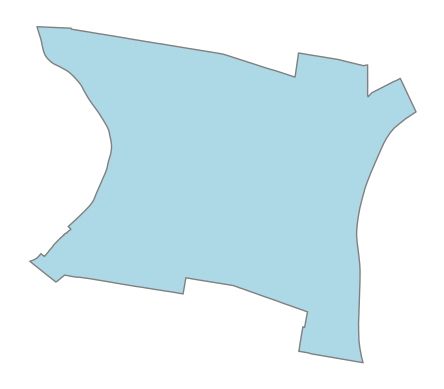

In [219]:
central_repoj = central.to_crs(central.estimate_utm_crs())
ax = central_repoj.plot(fc="lightblue", ec="gray")
ax.set_axis_off()

In [220]:
central.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [221]:
central_repoj.crs

<Projected CRS: EPSG:32618>
Name: WGS 84 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 78°W and 72°W, northern hemisphere between equator and 84°N, onshore and offshore. Bahamas. Canada - Nunavut; Ontario; Quebec. Colombia. Cuba. Ecuador. Greenland. Haiti. Jamaica. Panama. Turks and Caicos Islands. United States (USA). Venezuela.
- bounds: (-78.0, 0.0, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [222]:
center_city_outline = central.squeeze().geometry

center_city_outline, type(center_city_outline)

(<POLYGON ((-75.148 39.967, -75.147 39.967, -75.147 39.969, -75.147 39.97, -7...>,
 shapely.geometry.polygon.Polygon)

### 1.2 Get the street network graph

Use OSMnx to create a network graph (of type 'drive') from your polygon boundary in 1.1.

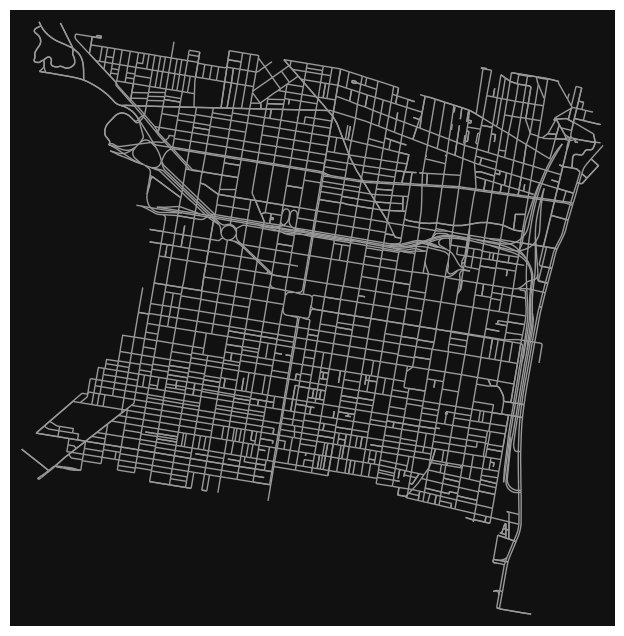

In [223]:
# Get the graph
G_cc = ox.graph_from_polygon(center_city_outline, network_type="drive")

ox.plot_graph(ox.project_graph(G_cc), node_size=0);

### 1.3 Convert your network graph edges to a GeoDataFrame

Use OSMnx to create a GeoDataFrame of the network edges in the graph object from part 1.2. The GeoDataFrame should contain the edges but not the nodes from the network.

In [224]:
cc_edges = ox.graph_to_gdfs(G_cc, edges=True, nodes=False)
cc_edges.head()

osmid      highway lanes                   name  \
u         v         key                                                        
109727439 109911666 0    132508434  residential     1      Bainbridge Street   
109727448 109727439 0     12109011  residential   NaN  South Colorado Street   
          110034229 0     12159387  residential   NaN       Fitzwater Street   
109727507 110024052 0    193364514  residential   NaN       Carpenter Street   
109728761 110274344 0    672312336  residential   NaN           Brown Street   

                         oneway reversed      length  \
u         v         key                                
109727439 109911666 0      True    False   44.347013   
109727448 109727439 0      True    False  109.496448   
          110034229 0      True    False   91.354184   
109727507 110024052 0      True    False   53.208442   
109728761 110274344 0      True    False   58.270358   

                                                                  geometry  \
u         v         key                                                      
109727439 109911666 0    LINESTRING (-75.17104 39.94345, -75.1706 39.94...   
109727448 109727439 0    LINESTRING (-75.17125 39.94248, -75.1712 39.94...   
          110034229 0    LINESTRING (-75.17125 39.94248, -75.17129 39.9...   
109727507 110024052 0    LINESTRING (-75.17196 39.93974, -75.17134 39.9...   
109728761 110274344 0    LINESTRING (-75.17317 39.96951, -75.1725 39.96...   

                        maxspeed  ref bridge tunnel width service access  \
u         v         key                                                    
109727439 109911666 0        NaN  NaN    NaN    NaN   NaN     NaN    NaN   
109727448 109727439 0        NaN  NaN    NaN    NaN   NaN     NaN    NaN   
          110034229 0        NaN  NaN    NaN    NaN   NaN     NaN    NaN   
109727507 110024052 0        NaN  NaN    NaN    NaN   NaN     NaN    NaN   
109728761 110274344 0     25 mph  NaN    NaN    NaN   NaN     NaN    NaN   

                        junction  
u         v         key           
109727439 109911666 0        NaN  
109727448 109727439 0        NaN  
          110034229 0        NaN  
109727507 110024052 0        NaN  
109728761 110274344 0        NaN

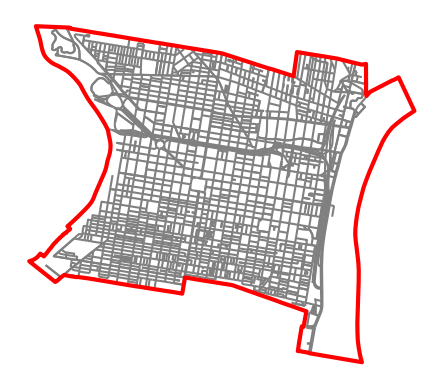

In [225]:
# plot it like any old GeoDataFrame
ax = cc_edges.to_crs(epsg=3857).plot(color="gray")

# add the neighborhood boundaries
boundary = gpd.GeoSeries([center_city_outline], crs="EPSG:4326")
boundary.to_crs(epsg=3857).plot(
    ax=ax, facecolor="none", edgecolor="red", linewidth=3, zorder=2
)

ax.set_axis_off()

In [226]:
cc_edges.explore(tiles='cartodb positron')

### 1.4 Load PennDOT crash data

Data for crashes (of all types) for 2020, 2021, and 2022 in Philadelphia County is available at the following path:

`./data/CRASH_PHILADELPHIA_XXXX.csv`

You should see three separate files in the `data/` folder. Use pandas to read each of the CSV files, and combine them into a single dataframe using `pd.concat()`.

The data was downloaded for Philadelphia County [from here](https://experience.arcgis.com/experience/51809b06e7b140208a4ed6fbad964990/page/County).

In [227]:
crashes = pd.concat(
    [pd.read_csv(f"./data/CRASH_PHILADELPHIA_{y}.csv") for y in range(2020, 2023)],
    ignore_index=True
)
crashes.head()

,CRN,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,DAY_OF_WEEK,DEC_LATITUDE,DEC_LONGITUDE,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECTION_RELATED,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROADWAY_CLEARED,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SECONDARY_CRASH,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOTAL_UNITS,TOT_INJ_COUNT,UNBELTED_OCC_COUNT,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WEATHER1,WEATHER2,WORKERS_PRES,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,WZ_WORKERS_INJ_KILLED
0,2020029257,1957.0,1,0,0,0,0,0,0,0,0,2,0,NaN,67,3,2020,3,39.994631,-75.094531,1948.0,6,0,0,0,0,0,0,0,0,NaN,0,0,0,NaN,NaN,4,NaN,1,NaN,39 59:40.673,NaN,0,75 05:40.311,4,0,0,0,67301,0,0,0,N,0,0,0,5,67301,4,NaN,1.0,NaN,1,N,N,N,0,NaN,0,0,1,NaN,2,NaN,NaN,2,4,3,0,0,0,1,2,0,2,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020008631,942.0,0,0,0,0,0,0,0,0,0,1,0,NaN,67,1,2020,7,40.040263,-75.006136,942.0,6,0,0,0,0,0,0,1,0,NaN,0,0,0,NaN,NaN,0,N,0,NaN,40 02:24.948,NaN,0,75 00:22.091,0,0,0,0,67301,0,0,0,N,0,0,0,3,68K01,0,NaN,1.0,NaN,9,N,N,N,0,NaN,0,0,2,NaN,0,NaN,NaN,2,0,0,0,0,0,0,2,0,2,NaN,7.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020006834,700.0,1,0,0,0,0,0,0,0,0,2,0,NaN,67,1,2020,6,40.024314,-75.161267,652.0,6,0,0,0,0,0,1,0,0,NaN,0,0,0,NaN,NaN,1,NaN,2,NaN,40 01:27.530,NaN,0,75 09:40.561,3,0,0,0,67301,0,0,0,N,0,0,0,3,67301,0,NaN,1.0,NaN,1,N,N,N,0,NaN,1,0,1,NaN,3,NaN,NaN,2,1,0,0,0,0,0,2,0,2,NaN,3.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020006451,825.0,2,0,0,0,0,0,0,0,0,4,0,NaN,67,1,2020,6,40.111993,-74.990569,814.0,6,0,0,0,0,0,1,0,0,NaN,0,0,0,NaN,NaN,0,NaN,1,NaN,40 06:43.175,NaN,0,74 59:26.049,0,0,0,0,67301,0,0,0,N,0,0,0,3,67301,0,NaN,1.0,NaN,1,N,N,N,0,NaN,0,0,1,NaN,2,NaN,NaN,3,0,0,0,0,0,0,2,0,3,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020008695,1115.0,0,0,0,0,0,0,0,0,0,7,0,NaN,67,1,2020,7,40.007399,-75.200078,1101.0,6,0,0,0,0,0,0,0,0,NaN,0,0,0,NaN,NaN,0,N,0,NaN,40 00:26.636,4.0,0,75 12:00.280,0,0,0,0,67301,0,0,0,N,0,0,0,1,68K01,0,NaN,4.0,20.0,9,N,N,N,1,NaN,0,0,0,NaN,0,N,NaN,1,0,0,0,0,0,0,2,0,1,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [228]:
crashes.shape

(29521, 99)

### 1.5 Convert the crash data to a GeoDataFrame

You will need to use the `DEC_LAT` and `DEC_LONG` columns for latitude and longitude.

In [229]:
# Drop rows with missing coordinates (optional but recommended)
crashes = crashes.dropna(subset=["DEC_LATITUDE", "DEC_LONGITUDE"])

# Convert to GeoDataFrame using DEC_LONG (x), DEC_LAT (y)
crashes_gdf = gpd.GeoDataFrame(
    crashes,
    geometry=gpd.points_from_xy(crashes.DEC_LONGITUDE, crashes.DEC_LATITUDE),
    crs="EPSG:4326"  # WGS84 latitude/longitude
)

type(crashes_gdf)

geopandas.geodataframe.GeoDataFrame

### 1.6 Trim the crash data to Center City

1. Get the boundary of the edges data frame (from part 1.3). Accessing the `.geometry.unary_union.convex_hull` property will give you a nice outer boundary region.
1. Trim the crashes using the `within()` function of the crash GeoDataFrame to find which crashes are within the boundary.

There should be about 3,750 crashes within the Central district.

In [230]:
cc_boundary = cc_edges.geometry.unary_union.convex_hull
crashes_center = crashes_gdf[crashes_gdf.within(cc_boundary)]

C:\Users\Lingx\AppData\Local\Temp\ipykernel_40388\1402913503.py:1: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cc_boundary = cc_edges.geometry.unary_union.convex_hull


In [231]:
crashes_center.shape

(3746, 100)

### 1.7 Re-project our data into an approriate CRS

We'll need to find the nearest edge (street) in our graph for each crash. To do this, `osmnx` will calculate the distance from each crash to the graph edges. For this calculation to be accurate, we need to convert from latitude/longitude 

**We'll convert the local state plane CRS for Philadelphia, EPSG=2272**

#### Two steps:
1. Project the graph object (`G_cc`) using the `ox.project_graph`. Run `ox.project_graph?` to see the documentation for how to convert to a specific CRS. 
1. Project the crash data using the `.to_crs()` function.

In [232]:
G_proj = ox.project_graph(G_cc, to_crs="EPSG:2272")
crashes_proj = crashes_gdf.to_crs("EPSG:2272")

### 1.8 Find the nearest edge for each crash

See: `ox.distance.nearest_edges()`. It takes three arguments:

- the network graph
- the longitude of your crash data (the `x` attribute of the `geometry` column)
- the latitude of your crash data (the `y` attribute of the `geometry` column)

You will get a numpy array with 3 columns that represent `(u, v, key)` where each `u` and `v` are the node IDs that the edge links together. We will ignore the `key` value for our analysis.

In [233]:
crash_x = crashes_proj.geometry.x.values
crash_y = crashes_proj.geometry.y.values

# Find nearest edges
nearest = ox.distance.nearest_edges(G_proj, X=crash_x, Y=crash_y)

nearest[:5]

array([(7738710013, 110207010, 0), (7738710013, 110207010, 0),
       (109839081, 109839088, 0), (7738710013, 110207010, 0),
       (2311089499, 110300444, 0)], dtype=object)

In [234]:
crashes_proj["u"] = [t[0] for t in nearest]
crashes_proj["v"] = [t[1] for t in nearest]
crashes_proj["key"] = [t[2] for t in nearest]


### 1.9 Calculate the total number of crashes per street

1. Make a DataFrame from your data from part 1.7 with three columns, `u`, `v`, and `key` (we will only use the `u` and `v` columns)
1. Group by `u` and `v` and calculate the size
1. Reset the index and name your `size()` column as `crash_count`

After this step you should have a DataFrame with three columns: `u`, `v`, and `crash_count`.

In [235]:
crash_edges = crashes_proj[["u", "v", "key"]]
crash_counts = (
    crash_edges
    .groupby(["u", "v"])
    .size()
    .reset_index(name="crash_count")
)
crash_counts

,u,v,crash_count
0,109729330,110216446,1
1,109729474,3425014859,2
2,109729661,109729673,1
3,109729709,109729731,4
4,109729731,109729739,2
...,...,...,...
975,11164250475,110329766,1
976,11337234967,110356246,2
977,11345699563,109811674,1
978,11345699563,11345699562,3


### 1.10 Merge your edges GeoDataFrame and crash count DataFrame

You can use pandas to merge them on the `u` and `v` columns. This will associate the total crash count with each edge in the street network. 

**Tips:** 
   - Use a `left` merge where the first argument of the merge is the edges GeoDataFrame. This ensures no edges are removed during the merge.
   - Use the `fillna(0)` function to fill in missing crash count values with zero.

In [236]:
# Merge crash_count onto edges GeoDataFrame
edges_with_counts = cc_edges.merge(
    crash_counts,          # right table
    on=["u", "v"],         # joining keys
    how="left"             # keep all edges
)

# Fill missing crash_count with 0
edges_with_counts["crash_count"] = edges_with_counts["crash_count"].fillna(0)

### 1.11 Calculate a "Crash Index"

Let's calculate a "crash index" that provides a normalized measure of the crash frequency per street. To do this, we'll need to:

1. Calculate the total crash count divided by the street length, using the `length` column
1. Perform a log transformation of the crash/length variable — use numpy's `log10()` function
1. Normalize the index from 0 to 1 (see the lecture notes for an example of this transformation)

**Note: since the crash index involves a log transformation, you should only calculate the index for streets where the crash count is greater than zero**.

After this step, you should have a new column in the data frame from 1.9 that includes a column called part 1.9.

In [237]:
edges_with_counts["crash_rate"] = (
    edges_with_counts["crash_count"] / edges_with_counts["length"]
)

edges_with_counts["log_rate"] = np.where(
    edges_with_counts["crash_rate"] > 0,
    np.log10(edges_with_counts["crash_rate"]),
    np.nan      # crash_count=0 
)

#normalize
log_min = edges_with_counts["log_rate"].min()
log_max = edges_with_counts["log_rate"].max()

edges_with_counts["crash_index"] = (
    (edges_with_counts["log_rate"] - log_min) /
    (log_max - log_min)
)


c:\Users\Lingx\anaconda3\envs\geospatial\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### 1.12 Plot a histogram of the crash index values

Use matplotlib's `hist()` function to plot the crash index values from the previous step.

You should see that the index values are Gaussian-distributed, providing justification for why we log-transformed!

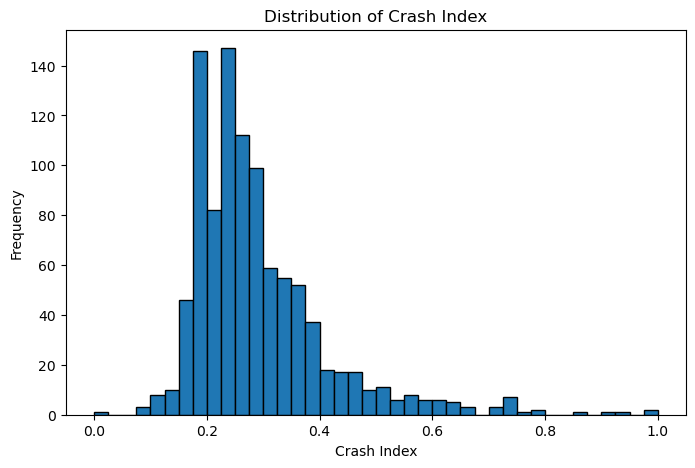

In [238]:
import matplotlib.pyplot as plt

# Select only valid crash_index values (non-NaN)
ci = edges_with_counts["crash_index"].dropna()

plt.figure(figsize=(8,5))
plt.hist(ci, bins=40, edgecolor='black')
plt.xlabel("Crash Index")
plt.ylabel("Frequency")
plt.title("Distribution of Crash Index")
plt.show()


### 1.13 Plot an interactive map of the street networks, colored by the crash index

You can use GeoPandas to make an interactive Folium map, coloring the streets by the crash index column.

**Tip:** if you use the viridis color map, try using a "dark" tile set for better constrast of the colors.

In [239]:
import folium
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors

gdf = edges_with_counts.copy()

gdf["crash_index"] = gdf["crash_index"].fillna(0)

gdf = gdf[gdf.geometry.notna()].copy()

white_red = colors.LinearSegmentedColormap.from_list(
    "white_red",
    [(1, 1.1, 0.9), (1, 0, 0)]  
)
norm = colors.Normalize(
    vmin=gdf["crash_index"].min(),
    vmax=gdf["crash_index"].max()
)
m = folium.Map(
    location=[39.9526, -75.1652],
    zoom_start=14,
    tiles="CartoDB dark_matter"
)
for _, row in gdf.iterrows():
    
    ci = row["crash_index"]
    if ci == 0:
        hex_color = "#A0A0A0"  
        opacity_val = 0.25
    else:
        rgba = white_red(norm(ci))
        hex_color = colors.to_hex(rgba)
        opacity_val = 1   
        
    folium.GeoJson(
        data=row["geometry"].__geo_interface__,
        style_function=lambda _, col=hex_color, op=opacity_val: {
            "color": col,
            "weight": 2,
            "opacity": op
        }
    ).add_to(m)
legend_html = """
<div style="
    position: fixed; 
    bottom: 30px; left: 30px; 
    z-index: 9999; 
    font-size: 16px; 
    background-color: rgba(30, 30, 30, 0.7);
    color: white; 
    padding: 10px 15px;
    border-radius: 6px;
">
<b>Crash Index</b><br>
Light yellow = Low<br>
Deep red = high<br>
Grey = none
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

m


## Part 2: Scraping Craigslist

In this part, we'll be extracting information on apartments from Craigslist search results. You'll be using Selenium and BeautifulSoup to extract the relevant information from the HTML text. 

For reference on CSS selectors, please see the [notes from Week 6](https://github.com/MUSA-550-Fall-2022/week-6/blob/main/css-selectors.md).

### Primer: the Craigslist website URL

We'll start with the Philadelphia region. First we need to figure out how to submit a query to Craigslist. As with many websites, one way you can do this is simply by constructing the proper URL and sending it to Craigslist. 

[https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=1~gallery~0~0](https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=1~gallery~0~0)

There are **three** components to this URL. 

1. The base URL: `http://philadelphia.craigslist.org/search/apa`

2. The user's search parameters: `?min_price=1&min_bedrooms=1&minSqft=1`

> We will send nonzero defaults for some parameters (bedrooms, size, price) in order to exclude results that have empty values for these parameters.


3. The URL *hash*: `#search=1~gallery~0~0`

> As we will see later, this part will be important because it contains the search page result number.


The Craigslist website requires Javascript, so we'll need to use Selenium to load the page, and then use BeautifulSoup to extract the information we want. 



### 2.1 Initialize a selenium driver and open Craigslist

As discussed in lecture, you can use Chrome, Firefox, or Edge as your selenium driver. In this part, you should do two things:

1. Initialize the selenium driver
1. Use the `driver.get()` function to open the following URL:

[https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=1~gallery~0~0](https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=1~gallery~0~0)

This will give you the search results for 1-bedroom apartments in Philadelphia.


In [240]:
pip install webdriver-manager


Note: you may need to restart the kernel to use updated packages.


In [241]:
pip install selenium


Note: you may need to restart the kernel to use updated packages.


In [242]:
from time import sleep
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager

driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()))

url = "https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=1gallery0~0"
driver.get(url)
sleep(5)


### 2.2 Initialize your "soup"

Once selenium has the page open, we can get the page source from the driver and use BeautifulSoup to parse it. In this part, initialize a BeautifulSoup object with the driver's page source



In [243]:
from bs4 import BeautifulSoup

In [244]:
html = driver.page_source

soup = BeautifulSoup(html, "html.parser")

soup

<html class="bd-can-hover cl-not-small-viewport cl-landscape cl-search-page cl-ng-search-page cl-panes-none cl-not-showing-posting cl-search-view-mode-gallery cl-no-show-map"><head>
<meta charset="utf-8"/>
<meta content="IE=Edge" http-equiv="X-UA-Compatible"/>
<meta content="width=device-width,initial-scale=1" name="viewport"/>
<meta content="craigslist" property="og:site_name"/>
<meta content="preview" name="twitter:card"/>
<meta content="philadelphia apartments / housing for rent - craigslist" property="og:title"/>
<meta content="philadelphia apartments / housing for rent - craigslist" name="description"/>
<meta content="philadelphia apartments / housing for rent - craigslist" property="og:description"/>
<meta content="https://philadelphia.craigslist.org/search/apa" property="og:url"/>
<title>philadelphia  apartments / housing for rent   - craigslist</title>
<link href="https://philadelphia.craigslist.org/search/apa" rel="canonical"/>
<link href="https://philadelphia.craigslist.org/s

### 2.3 Parsing the HTML

Now that we have our "soup" object, we can use BeautifulSoup to extract out the elements we need:

- Use the Web Inspector to identify the HTML element that holds the information on each apartment listing.
- Use BeautifulSoup to extract these elements from the HTML. 


At the end of this part, you should have a list of 120 elements, where each element is the listing for a specific apartment on the search page.

In [245]:
listings = soup.find_all("div", class_="cl-search-result")
len(listings)


200

### 2.4 Find the relevant pieces of information

We will now focus on the **first element** in the list of 120 apartments. Use the `prettify()` function to print out the HTML for this first element. 

From this HTML, identify the HTML elements that hold:

- The apartment price
- The number of bedrooms
- The square footage
- The apartment title

For the first apartment, print out each of these pieces of information, using BeautifulSoup to select the proper elements.


In [246]:
first = listings[0]

In [247]:

print(first.prettify())
                                                                                

<div class="cl-search-result cl-search-view-mode-gallery" data-pid="7902078142" title="one-of-a-kind top floor penthouse">
 <div class="gallery-card">
  <div class="cl-gallery">
   <div class="gallery-inner">
    <a class="main" href="https://philadelphia.craigslist.org/apa/d/philadelphia-one-of-kind-top-floor/7902078142.html">
     <div class="swipe" style="visibility: visible;">
      <div class="swipe-wrap" style="width: 6122.67px;">
       <div data-index="0" style="width: 382.667px; left: 0px; transition-duration: 0ms; transform: translateX(0px);">
        <span class="loading icom-">
        </span>
        <img alt="one-of-a-kind top floor penthouse 1" data-image-index="0" src="https://images.craigslist.org/d/7902078142/00a0a_eqgT0ZAGqT8_0kE0cX_600x450.jpg"/>
       </div>
       <div data-index="1" style="width: 382.667px; left: -382.667px; transition-duration: 0ms; transform: translateX(382.667px);">
       </div>
       <div data-index="2" style="width: 382.667px; left: -765.

In [248]:
first = listings[0]

# Title
title_tag = first.find("span", class_="label")
title = title_tag.get_text(strip=True) if title_tag else None

# Bedrooms
bed_tag = first.find("span", class_="post-bedrooms")
bedrooms = bed_tag.get_text(strip=True).replace("br", "").strip() if bed_tag else None

# Square footage
sqft_tag = first.find("span", class_="post-sqft")
if sqft_tag:
    sqft_text = sqft_tag.get_text(strip=True)
    sqft_text = sqft_text.split("ft")[0]
    sqft = ''.join([c for c in sqft_text if c.isdigit()])
else:
    sqft = None

# Price
price_tag = first.find("span", class_="priceinfo")
price = price_tag.get_text(strip=True) if price_tag else None

print("Title:", title)
print("Price:", price)
print("Sqft:", sqft)
print("Bedrooms:", bedrooms)



Title: one-of-a-kind top floor penthouse
Price: $1,635
Sqft: 823
Bedrooms: 1


### 2.5 Functions to format the results 

In this section, you'll create functions that take in the raw string elements for price, size, and number of bedrooms and returns them formatted as numbers.

I've started the functions to format the values. You should finish theses functions in this section.

**Hints**
- You can use string formatting functions like `string.replace()` and `string.strip()`
- The `int()` and `float()` functions can convert strings to numbers

In [249]:
def format_bedrooms(bedrooms_string):
    # Format the bedrooms string and return an int
    
    if bedrooms_string is None:
        return None
    
    # Remove the "br" text and whitespace
    cleaned = bedrooms_string.replace("br", "").strip()
    
    # Convert to an integer
    if cleaned.isdigit():
        return int(cleaned)
    
    return None


In [250]:
def format_size(size_string):
    # Format the size string and return a float
    
    if size_string is None:
        return None
    
    # Craigslist sometimes inserts exponent 2 separately.
    # We remove "ft" and any non-digit characters.
    cleaned = size_string.split("ft")[0]
    cleaned = "".join([c for c in cleaned if c.isdigit()])
    
    if cleaned.isdigit():
        return float(cleaned)
    
    return None


In [251]:
def format_price(price_string):
    # Format the price string and return a float
    
    if price_string is None:
        return None
    
    # Remove the $ symbol and commas
    cleaned = price_string.replace("$", "").replace(",", "").strip()
    
    # Some listings might include "/mo" or extra text — keep only digits
    digits = "".join([c for c in cleaned if c.isdigit()])
    
    if digits.isdigit():
        return float(digits)
    
    return None


### 2.6 Putting it all together

In this part, you'll complete the code block below using results from previous parts. The code will loop over 5 pages of search results and scrape data for 600 apartments. 

We can get a specific page by changing the `search=PAGE` part of the URL hash. For example, to get page 2 instead of page 1, we will navigate to:


[https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=2~gallery~0~0](https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1#search=2~gallery~0~0)

In the code below, the outer for loop will loop over 5 pages of search results. The inner for loop will loop over the 120 apartments listed on each search page.

Fill in the missing pieces of the inner loop using the code from the previous section. We will be able to extract out the relevant pieces of info for each apartment. 

After filling in the missing pieces and executing the code cell, you should have a Data Frame called `results` that holds the data for 600 apartment listings.

#### Notes

Be careful if you try to scrape more listings. Craigslist will temporarily ban your IP address (for a very short time) if you scrape too much at once. I've added a `sleep()` function to the for loop to wait 30 seconds between scraping requests.

If the for loop gets stuck at the "Processing page X..." step for more than a minute or so, your IP address is probably banned temporarily, and you'll have to wait a few minutes before trying again.

In [252]:
from time import sleep

In [253]:
results = []

# search in batches of 120 for 5 pages
# NOTE: you will get temporarily banned if running more than ~5 pages or so
# the API limits are more leninient during off-peak times, and you can try
# experimenting with more pages
max_pages = 5

base_url = "https://philadelphia.craigslist.org/search/apa?min_price=1&min_bedrooms=1&minSqft=1"

for page_num in range(1, max_pages + 1):
    print(f"Processing page {page_num}...")

    url_hash = f"#search={page_num}~gallery~0~0"
    url = base_url + url_hash

    driver.get(url)
    sleep(5)

    # YOUR CODE: get all apartments
    html = driver.page_source
    soup = BeautifulSoup(html, "html.parser")

    # your page uses <div class="cl-search-result">
    apts = soup.find_all("div", class_="cl-search-result")

    print("Number of apartments = ", len(apts))

    page_results = []

    # Loop through each apartment
    for apt in apts:

        # Bedrooms
        bed_tag = apt.find("span", class_="post-bedrooms")
        bedrooms = bed_tag.get_text(strip=True) if bed_tag else None

        # Size (sqft)
        sqft_tag = apt.find("span", class_="post-sqft")
        size = sqft_tag.get_text(strip=True) if sqft_tag else None

        # Title
        title_tag = apt.find("span", class_="label")
        title = title_tag.get_text(strip=True) if title_tag else None

        # Price
        price_tag = apt.find("span", class_="priceinfo")
        price = price_tag.get_text(strip=True) if price_tag else None

        # Format using functions from Part 1.5
        bedrooms = format_bedrooms(bedrooms)
        size = format_size(size)
        price = format_price(price)

        page_results.append([price, size, bedrooms, title])

    col_names = ["price", "size", "bedrooms", "title"]
    df = pd.DataFrame(page_results, columns=col_names)
    results.append(df)

    print("sleeping for 10 seconds between calls")
    sleep(10)

# Final concat
results = pd.concat(results, axis=0).reset_index(drop=True)


Processing page 1...
Number of apartments =  200
sleeping for 10 seconds between calls
Processing page 2...
Number of apartments =  200
sleeping for 10 seconds between calls
Processing page 3...
Number of apartments =  200
sleeping for 10 seconds between calls
Processing page 4...
Number of apartments =  200
sleeping for 10 seconds between calls
Processing page 5...
Number of apartments =  200
sleeping for 10 seconds between calls


### 2.7 Plotting the distribution of prices

Use matplotlib's `hist()` function to make two histograms for:

- Apartment prices
- Apartment prices per square foot (price / size)

Make sure to add labels to the respective axes and a title describing the plot.

#### Side note: rental prices per sq. ft. from Craigslist

The histogram of price per sq ft should be centered around ~1.5. Here is a plot of how Philadelphia's rents compare to the other most populous cities:

<img src="imgs/rental_prices_psf.png" width=600/>

[Source](https://arxiv.org/pdf/1605.05397.pdf)

#### Distribution of Apartment Prices ####

This histogram shows the distribution of monthly rents for 1-bedroom apartments scraped from Craigslist in Philadelphia.
A few key observations:

Most listings fall between 2,500 and 2,200 per month.
A smaller number of units are priced lower (around 800–1,200), which are likely older units or located in less desirable neighborhoods.
There are several high-priced outliers above $2,500, typically representing newly renovated units, luxury buildings, or premium locations.
The distribution is lightly right-skewed, indicating that high-price listings are less frequent but extend the tail.
Overall, this plot captures the general rental price range for 1BR apartments in the city.

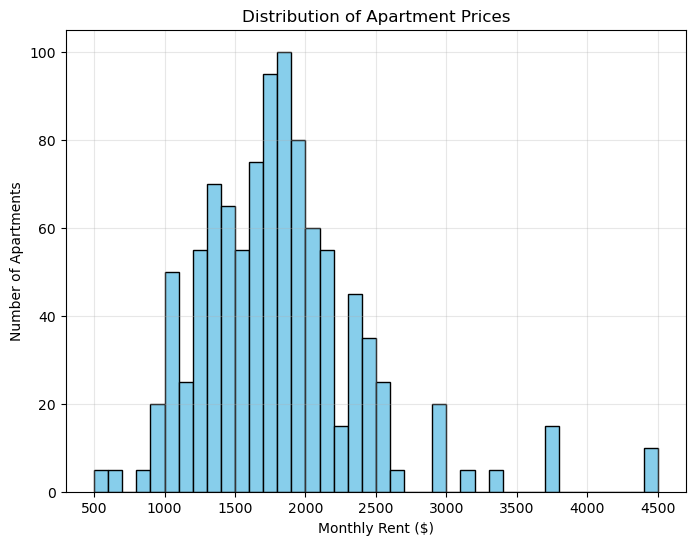

In [254]:
results["price_per_sqft"] = results["price"] / results["size"]
results_clean = results.dropna(subset=["price", "size"])

import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.hist(results_clean["price"], bins=40, color="skyblue", edgecolor="black")

plt.xlabel("Monthly Rent ($)")
plt.ylabel("Number of Apartments")
plt.title("Distribution of Apartment Prices")
plt.grid(alpha=0.3)

plt.show()


#### Distribution of Apartment Sizes ####

This histogram displays the distribution of apartment sizes (in square feet) across the scraped listings.

Most apartments fall within 600–900 sqft, which is typical for 1-bedroom units.
Very small apartments (<500 sqft) are relatively uncommon.
Larger units (>1000 sqft) are also rare and usually correspond to lofts or premium 1BR apartments.

This size distribution reflects the typical range of 1BR apartments available in Philadelphia’s rental market.

However, there is a noticeable spike around 800 sqft, suggesting an unusually large number of listings at this size. This anomaly should be further validated.

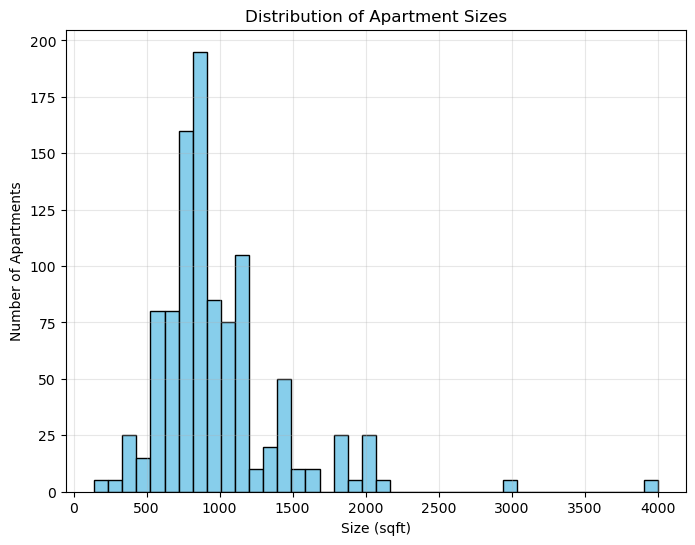

In [255]:
plt.figure(figsize=(8,6))
plt.hist(results_clean["size"], bins=40, color="skyblue", edgecolor="black")

plt.xlabel("Size (sqft)")
plt.ylabel("Number of Apartments")
plt.title("Distribution of Apartment Sizes")
plt.grid(alpha=0.3)

plt.show()

#### Distribution of Price per Square Foot ####

This plot shows the distribution of price per square foot, calculated as monthly rent divided by apartment size.
    
Most listings fall between 1.5 and 3.0 per sqft.
The central peak lies around 2.0–2.5 per sqft, which aligns well with typical market values in Philadelphia.
A few listings fall below 1 per sqft, usually large units with lower overall rent.
Some units exceed 3 per sqft, reflecting high-end or recently renovated apartments.

Price per square foot provides a normalized measure of value across units of different sizes, making it easier to compare apartments objectively.

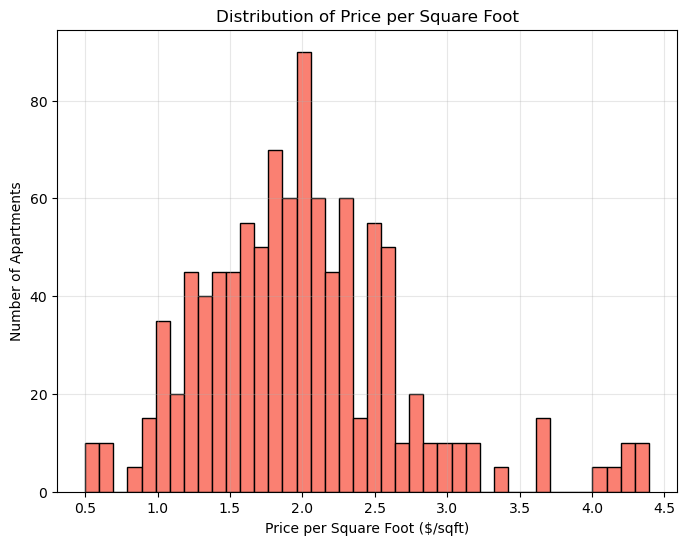

In [256]:
plt.figure(figsize=(8,6))
plt.hist(results_clean["price_per_sqft"], bins=40, color="salmon", edgecolor="black")

plt.xlabel("Price per Square Foot ($/sqft)")
plt.ylabel("Number of Apartments")
plt.title("Distribution of Price per Square Foot")
plt.grid(alpha=0.3)

plt.show()


### 2.8 Comparing prices for different sizes 

Use `altair` to explore the relationship between price, size, and number of bedrooms. Make an interactive scatter plot of price (x-axis) vs. size (y-axis), with the points colored by the number of bedrooms. 

Make sure the plot is interactive (zoom-able and pan-able) and add a tooltip with all of the columns in our scraped data frame.

With this sort of plot, you can quickly see the outlier apartments in terms of size and price.

In [263]:
import altair as alt

df_clean = results.dropna(subset=["price", "size", "bedrooms"])

alt.data_transformers.disable_max_rows()

chart = (
    alt.Chart(df_clean)
    .mark_circle(size=60, opacity=0.7)
    .encode(
        x=alt.X("price:Q", title="Monthly Rent ($)"),
        y=alt.Y("size:Q", title="Size (sqft)"),
        
        # Bedrooms: light yellow -> deep red
        color=alt.Color(
            "bedrooms:Q",
            title="Bedrooms",
            scale=alt.Scale(range=["#EAD74D", "#EBA822", "#FC2200"])
        ),
        
        tooltip=list(df_clean.columns)
    )
    .properties(
        width=650,
        height=420,
        title="Apartment Price vs. Size (Color = Bedrooms)"
    )
    .interactive()
).configure_view(
    fill="#3F3F3F"
)


chart


alt.Chart(...)